In [ ]:
!git clone 'https://github.com/JasonCaoGit/Track'


fatal: destination path 'Track' already exists and is not an empty directory.


In [ ]:
!ls Track

driving_log.csv  IMG


In [ ]:
!pip3 install imgaug

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.layers import Dense, MaxPooling2D, Convolution2D, Flatten, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
import cv2
import pandas as pd
import random
import os
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from keras.models import load_model
from imgaug import augmenters as iaa

In [ ]:

datadir = "Track"
# columns = ["center","left","right","steering","throttle","reverse","speed"]
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth',None)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_219.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_219.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_219.jpg,0.0,0.0,0,0.000079
1,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_327.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_327.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_327.jpg,0.0,0.0,0,0.000078
2,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_428.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_428.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_428.jpg,0.0,0.0,0,0.000078
3,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_538.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_538.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_538.jpg,0.0,0.0,0,0.000078
4,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_648.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_648.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_648.jpg,0.0,0.0,0,0.000080


,center,left,right,steering,throttle,reverse,speed
0,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_219.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_219.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_219.jpg,0.0,0.0,0,0.000079
1,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_327.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_327.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_327.jpg,0.0,0.0,0,0.000078
2,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_428.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_428.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_428.jpg,0.0,0.0,0,0.000078
3,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_538.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_538.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_538.jpg,0.0,0.0,0,0.000078
4,D:\Self Driving\Data\IMG\center_2024_06_13_12_23_54_648.jpg,D:\Self Driving\Data\IMG\left_2024_06_13_12_23_54_648.jpg,D:\Self Driving\Data\IMG\right_2024_06_13_12_23_54_648.jpg,0.0,0.0,0,0.000080


In [ ]:
import ntpath
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].astype(str).apply(path_leaf)
data['left'] = data['left'].astype(str).apply(path_leaf)
data['right'] = data['right'].astype(str).apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_06_13_12_23_54_219.jpg,left_2024_06_13_12_23_54_219.jpg,right_2024_06_13_12_23_54_219.jpg,0.0,0.0,0,0.000079
1,center_2024_06_13_12_23_54_327.jpg,left_2024_06_13_12_23_54_327.jpg,right_2024_06_13_12_23_54_327.jpg,0.0,0.0,0,0.000078
2,center_2024_06_13_12_23_54_428.jpg,left_2024_06_13_12_23_54_428.jpg,right_2024_06_13_12_23_54_428.jpg,0.0,0.0,0,0.000078
3,center_2024_06_13_12_23_54_538.jpg,left_2024_06_13_12_23_54_538.jpg,right_2024_06_13_12_23_54_538.jpg,0.0,0.0,0,0.000078
4,center_2024_06_13_12_23_54_648.jpg,left_2024_06_13_12_23_54_648.jpg,right_2024_06_13_12_23_54_648.jpg,0.0,0.0,0,0.000080


,center,left,right,steering,throttle,reverse,speed
0,center_2024_06_13_12_23_54_219.jpg,left_2024_06_13_12_23_54_219.jpg,right_2024_06_13_12_23_54_219.jpg,0.0,0.0,0,0.000079
1,center_2024_06_13_12_23_54_327.jpg,left_2024_06_13_12_23_54_327.jpg,right_2024_06_13_12_23_54_327.jpg,0.0,0.0,0,0.000078
2,center_2024_06_13_12_23_54_428.jpg,left_2024_06_13_12_23_54_428.jpg,right_2024_06_13_12_23_54_428.jpg,0.0,0.0,0,0.000078
3,center_2024_06_13_12_23_54_538.jpg,left_2024_06_13_12_23_54_538.jpg,right_2024_06_13_12_23_54_538.jpg,0.0,0.0,0,0.000078
4,center_2024_06_13_12_23_54_648.jpg,left_2024_06_13_12_23_54_648.jpg,right_2024_06_13_12_23_54_648.jpg,0.0,0.0,0,0.000080


[-1.        -0.9213524 -0.8427048 -0.7640572 -0.6854096 -0.606762
 -0.5281144 -0.4494668 -0.3708192 -0.2921716 -0.213524  -0.1348764
 -0.0562288  0.0224188  0.1010664  0.179714   0.2583616  0.3370092
  0.4156568  0.4943044  0.572952   0.6515996  0.7302472  0.8088948
  0.8875424  0.96619  ]
0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
5488    0.0
5489    0.0
5490    0.0
5491    0.0
5492    0.0
Name: steering, Length: 5493, dtype: float64


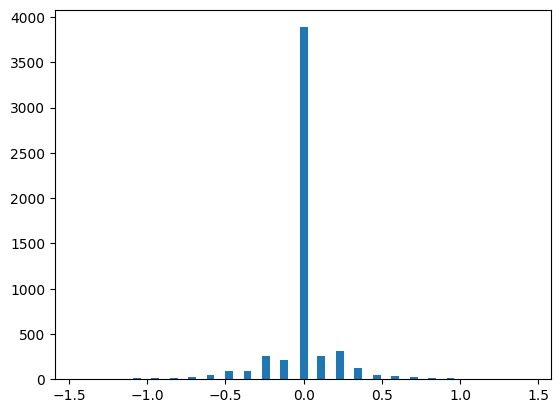

[-1.        -0.9213524 -0.8427048 -0.7640572 -0.6854096 -0.606762
 -0.5281144 -0.4494668 -0.3708192 -0.2921716 -0.213524  -0.1348764
 -0.0562288  0.0224188  0.1010664  0.179714   0.2583616  0.3370092
  0.4156568  0.4943044  0.572952   0.6515996  0.7302472  0.8088948
  0.8875424  0.96619  ]
0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
5488    0.0
5489    0.0
5490    0.0
5491    0.0
5492    0.0
Name: steering, Length: 5493, dtype: float64


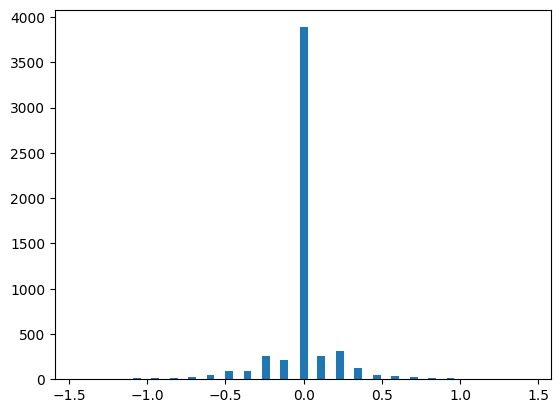

In [ ]:
import math
num_bins = 25
samples_per_bin = 800

hist, bins = np.histogram(data['steering'], num_bins)
print(bins)

center= np.around(bins,2)

center = bins[1:] + bins[:-1] * 0.5

center[12]=0

plt.bar(center, hist, width=0.05)
print(data['steering'])

removed: 3087
remaining: 2406


<BarContainer object of 25 artists>

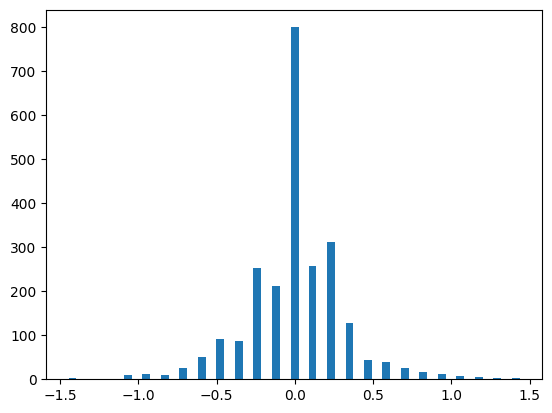

removed: 3087
remaining: 2406


<BarContainer object of 25 artists>

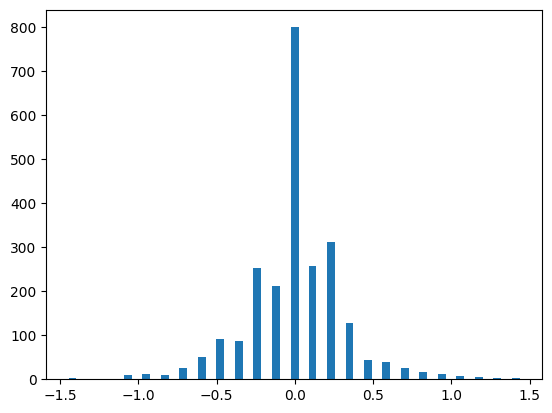

In [ ]:
from sklearn.utils import shuffle
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)

In [ ]:
print(data.iloc[1])
def load_img_steering(datadir,df):
  image_path=[]
  steering= []
  for i in range(len(df)):
    index_data = df.iloc[i]
    center, left, right = index_data[0], index_data[1],index_data[2]
    image_path.append(os.path.join(datadir, center))
    steering.append(index_data[3])
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
image_paths , steerings = load_img_steering(datadir+'/IMG', data)

center      center_2024_06_13_12_23_54_428.jpg
left          left_2024_06_13_12_23_54_428.jpg
right        right_2024_06_13_12_23_54_428.jpg
steering                                   0.0
throttle                                   0.0
reverse                                      0
speed                                 0.000078
Name: 2, dtype: object
center      center_2024_06_13_12_23_54_980.jpg
left          left_2024_06_13_12_23_54_980.jpg
right        right_2024_06_13_12_23_54_980.jpg
steering                                   0.0
throttle                                   0.0
reverse                                      0
speed                                 0.000084
Name: 7, dtype: object


In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size = 0.2, random_state = 6)
print(len(X_train))
print(len(X_valid))


1924
482
1924
482


Text(0.5, 1.0, 'Validation')

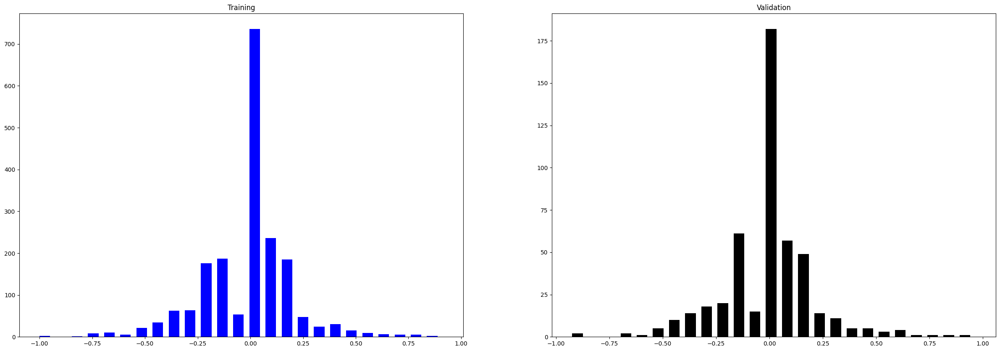

Text(0.5, 1.0, 'Validation')

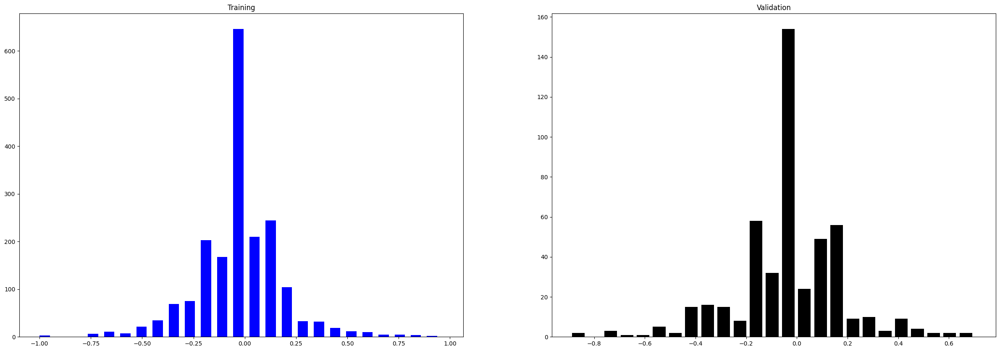

In [ ]:
fig , axs = plt.subplots(1,2, figsize = (30,10))
axs[0].hist(y_train, bins= num_bins, color='blue',width = 0.05)
axs[0].set_title('Training')
axs[1].hist(y_valid, bins= num_bins, color='black', width = 0.05 )
axs[1].set_title('Validation')

In [ ]:
def zoom(img):
  zoom = iaa.Affine(scale = (1,1.3))
  img = zoom.augment_image(img)
  return img

Text(0.5, 1.0, 'Augmented')

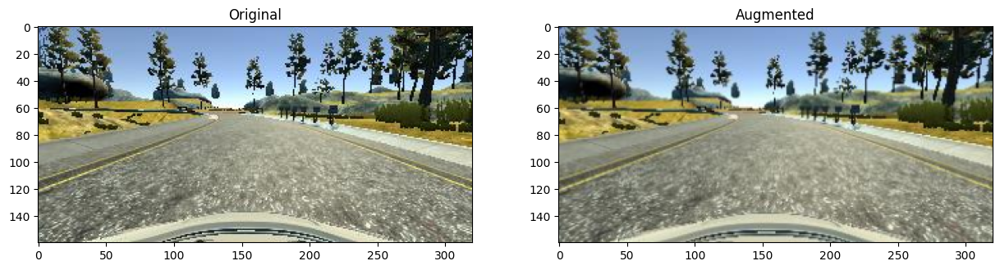

Text(0.5, 1.0, 'Augmented')

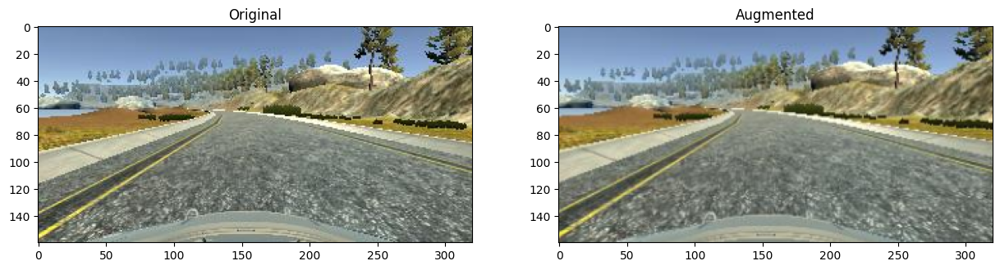

In [ ]:
random_image = image_paths[random.randint(0, len(image_paths)-1)]
original_image = mpimg.imread(random_image)
augmented_image = zoom(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
axs[0].imshow(original_image)
axs[0].set_title('Original')
axs[1].imshow(augmented_image)
axs[1].set_title('Augmented')


In [ ]:
def pan(img):
  pan = iaa.Affine(translate_percent= {'x':(-0.1,0.1),'y':(-0.1,0.1)})
  img = pan.augment_image(img)
  return img

Text(0.5, 1.0, 'Augmented')

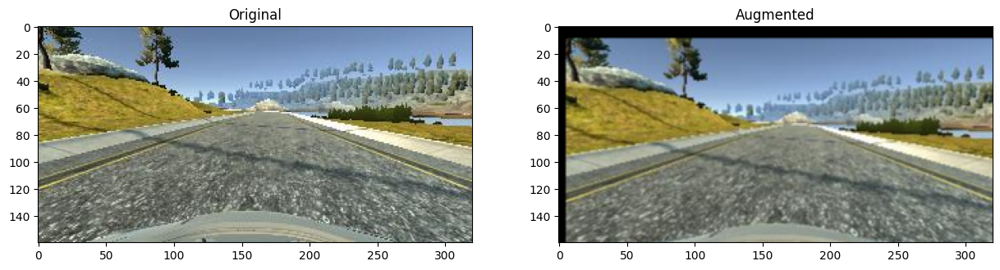

Text(0.5, 1.0, 'Augmented')

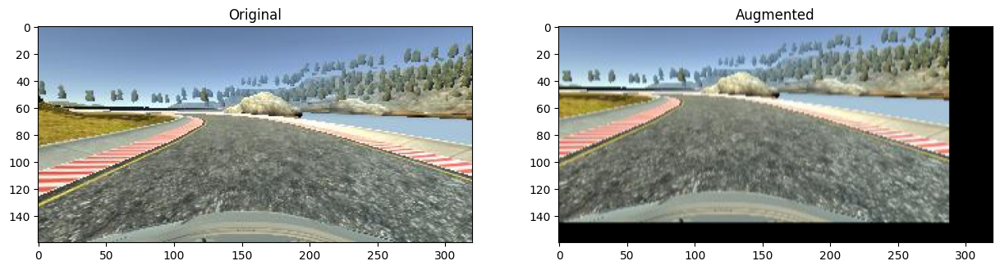

In [ ]:
random_image = image_paths[random.randint(0, len(image_paths)-1)]
original_image = mpimg.imread(random_image)
augmented_image = pan(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
axs[0].imshow(original_image)
axs[0].set_title('Original')
axs[1].imshow(augmented_image)
axs[1].set_title('Augmented')

In [ ]:
def random_brightness(img):
  brightness = iaa.Multiply((0.2,1.2))
  img = brightness.augment_image(img)
  return img

Text(0.5, 1.0, 'Augmented')

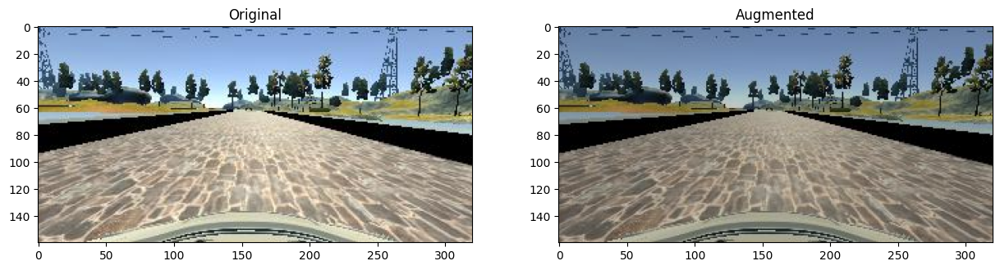

Text(0.5, 1.0, 'Augmented')

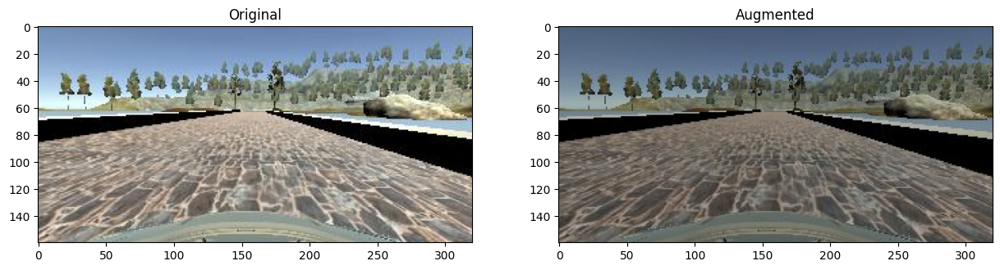

In [ ]:
random_image = image_paths[random.randint(0, len(image_paths)-1)]
original_image = mpimg.imread(random_image)
augmented_image = random_brightness(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
axs[0].imshow(original_image)
axs[0].set_title('Original')
axs[1].imshow(augmented_image)
axs[1].set_title('Augmented')

In [ ]:
def random_flip(img,steering):
  img= cv2.flip(img,1)
  steering = -steering
  return img,steering

Text(0.5, 1.0, 'Augmented-0.0')

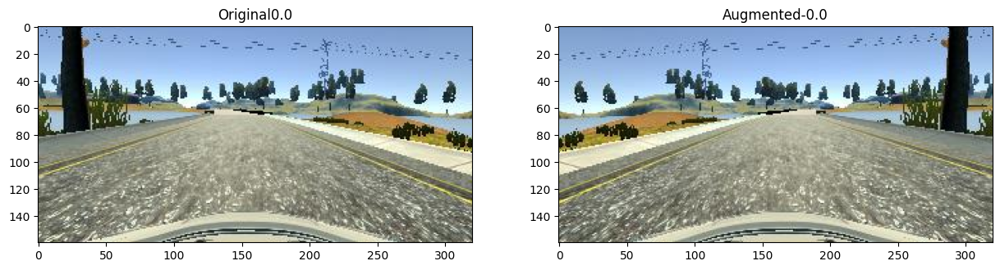

Text(0.5, 1.0, 'Augmented-0.0')

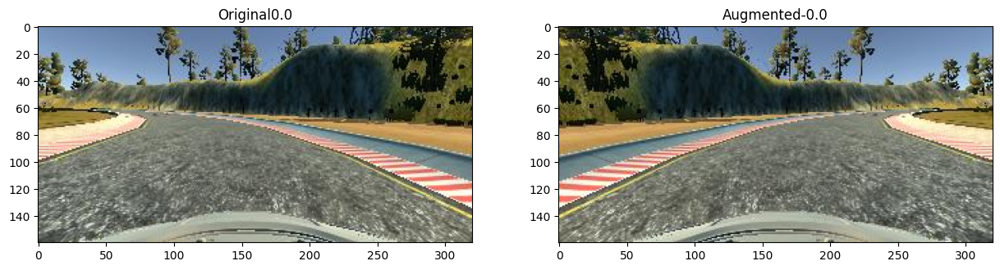

In [ ]:
randint= random.randint(0, len(image_paths)-1)
random_image,original_steering = image_paths[randint], steerings[randint]
original_image = mpimg.imread(random_image)
augmented_image, steering = random_flip(original_image,original_steering)

fig,axs = plt.subplots(1,2,figsize = (15,10))
axs[0].imshow(original_image)
axs[0].set_title('Original' + str(original_steering))
axs[1].imshow(augmented_image)
axs[1].set_title('Augmented'+ str(steering))

In [ ]:
def random_augment(img,steering):
  img= mpimg.imread(img)
  if np.random.rand()<0.5:
    img = zoom(img)
  if np.random.rand()<0.5:
    img = pan(img)
  if np.random.rand()<0.5:
    img = random_brightness(img)
  if np.random.rand()<0.5:
    img,steering = random_flip(img,steering)
  return img,steering

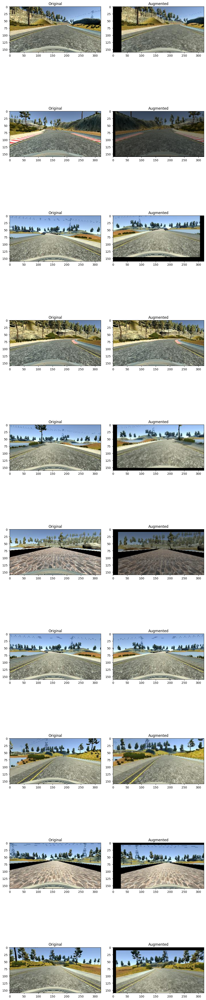

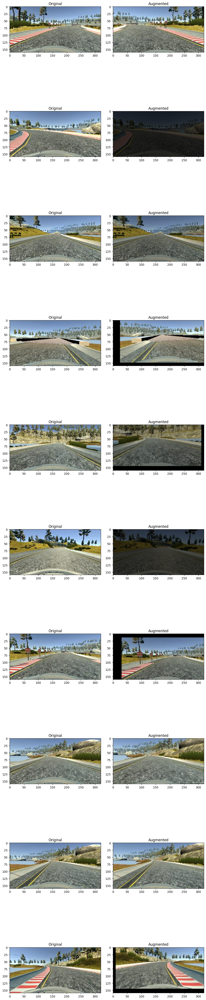

In [ ]:
cols = 2
rows = 10

fig,axs = plt.subplots(rows,cols, figsize=(10,50))
fig.tight_layout()

for i in range(rows):
  randint = random.randint(0, len(image_paths)-1)
  random_img, steering = image_paths[randint], steerings[randint]

  orginal_img = mpimg.imread(random_img)
  augmented_img, steering= random_augment(random_img, steering)

  axs[i][0].imshow(orginal_img)
  axs[i][0].set_title('Original')
  axs[i][1].imshow(augmented_img)
  axs[i][1].set_title('Augmented')


In [ ]:
def img_preprocess(img):

  img = img[60:130,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3,3),0)
  img= cv2.resize(img,(200,66))
  img= img/255
  return img

In [ ]:
# image = image_paths[100]
# original_image = mpimg.imread(image)
# processed = img_preprocess(image)

# fig,axs = plt.subplots(1,2, figsize = (20,10))
# axs[0].imshow(original_image)
# axs[1].imshow(processed)

In [ ]:
def batch_generator(image_paths, steerings, batch_size, isTraining):
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      random_index = random.randint(0,len(image_paths)- 1)
      if isTraining:
        im, steering = random_augment(image_paths[random_index], steerings[random_index])
      else:
        im = mpimg.imread(image_paths[random_index] )
        steering = steerings[random_index]
      im =  img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))



Text(0.5, 1.0, 'Augmented0.1484262')

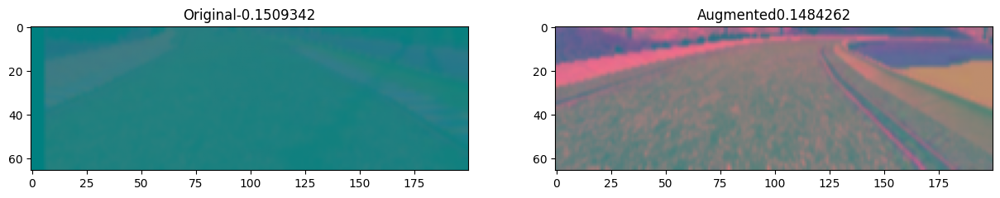

Text(0.5, 1.0, 'Augmented0.1933662')

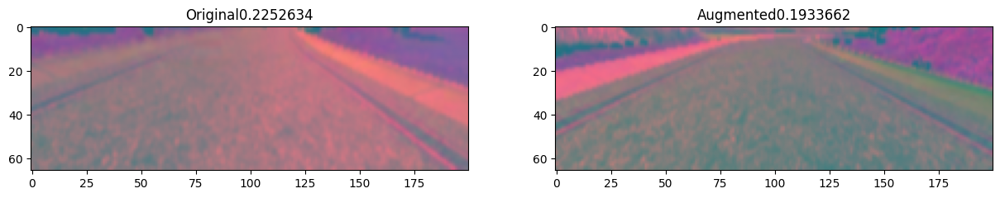

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig,axs = plt.subplots(1,2,figsize = (15,10))
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Original' + str(y_train_gen[0]))
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Augmented'+ str(y_valid_gen[0]))

In [ ]:
# X_train = np.array(list(map(img_preprocess,X_train)))
# X_valid = np.array(list(map(img_preprocess,X_valid)))


In [ ]:
# import random
# plt.imshow(X_train[random.randint(0,len(X_train)-1)])
# print(X_train.shape)

In [ ]:
def nvidia_model():
  model =Sequential()
  model.add(Convolution2D(24,kernel_size = (5,5),input_shape = (66,200,3),strides=(2,2),activation='elu'))
  model.add(Convolution2D(36,kernel_size = (5,5),strides=(2,2),activation='elu'))
  model.add(Convolution2D(48,kernel_size = (5,5),strides=(2,2),activation='elu'))
  model.add(Convolution2D(64,kernel_size = (3,3),activation='elu'))
  model.add(Convolution2D(64,kernel_size = (3,3),activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  # model.add(Dropout(0.5))
  model.add(Dense(50, activation='elu'))
  # model.add(Dropout(0.5))
  model.add(Dense(10, activation='elu'))
  # model.add(Dropout(0.5))
  model.add(Dense(1))
  model.compile(optimizer= Adam(lr=1e-1), loss= 'mean_squared_error')
  return model

model = nvidia_model()





In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, True), steps_per_epoch = 300, epochs = 10,
                              validation_data = batch_generator(X_valid, y_valid, 100,0),
                              validation_steps = 200,
                              shuffle = 1


                              )

<ipython-input-92-38e92fa74de0>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, True), steps_per_epoch = 300, epochs = 10,


Epoch 1/10
300/300 [==============================] - 150s 487ms/step - loss: 0.0827 - val_loss: 0.0418
Epoch 2/10
300/300 [==============================] - 127s 426ms/step - loss: 0.0369 - val_loss: 0.0338
Epoch 3/10
300/300 [==============================] - 140s 467ms/step - loss: 0.0325 - val_loss: 0.0292
Epoch 4/10
300/300 [==============================] - 141s 470ms/step - loss: 0.0300 - val_loss: 0.0257
Epoch 5/10
300/300 [==============================] - 128s 429ms/step - loss: 0.0269 - val_loss: 0.0246
Epoch 6/10
300/300 [==============================] - 137s 457ms/step - loss: 0.0246 - val_loss: 0.0247
Epoch 7/10
300/300 [==============================] - 137s 459ms/step - loss: 0.0234 - val_loss: 0.0229
Epoch 8/10
300/300 [==============================] - 128s 428ms/step - loss: 0.0229 - val_loss: 0.0219
Epoch 9/10
300/300 [==============================] - 130s 434ms/step - loss: 0.0220 - val_loss: 0.0212
Epoch 10/10
300/300 [==============================] - 138s 462m

<ipython-input-123-38e92fa74de0>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, True), steps_per_epoch = 300, epochs = 10,


Epoch 1/10
300/300 [==============================] - 148s 487ms/step - loss: 0.0663 - val_loss: 0.0297
Epoch 2/10
300/300 [==============================] - 131s 439ms/step - loss: 0.0345 - val_loss: 0.0290
Epoch 3/10
300/300 [==============================] - 142s 476ms/step - loss: 0.0303 - val_loss: 0.0228
Epoch 4/10
300/300 [==============================] - 128s 426ms/step - loss: 0.0279 - val_loss: 0.0250
Epoch 5/10
300/300 [==============================] - 128s 428ms/step - loss: 0.0257 - val_loss: 0.0239
Epoch 6/10
300/300 [==============================] - 129s 431ms/step - loss: 0.0254 - val_loss: 0.0249
Epoch 7/10
300/300 [==============================] - 127s 423ms/step - loss: 0.0247 - val_loss: 0.0218
Epoch 8/10
300/300 [==============================] - 126s 422ms/step - loss: 0.0240 - val_loss: 0.0239
Epoch 9/10
300/300 [==============================] - 127s 425ms/step - loss: 0.0229 - val_loss: 0.0224
Epoch 10/10
300/300 [==============================] - 140s 469m

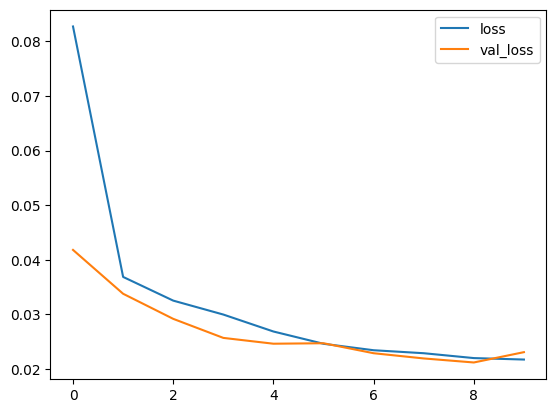

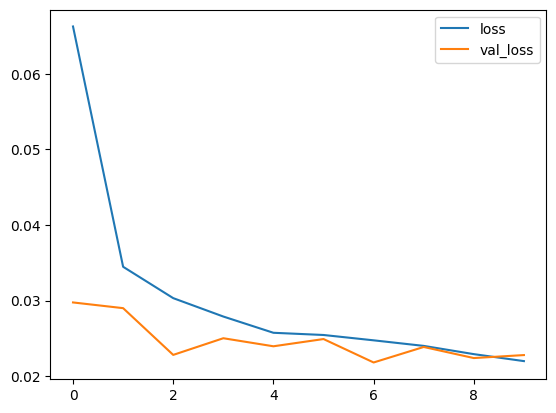

In [ ]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['loss','val_loss'])

In [ ]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>